<a href="https://colab.research.google.com/github/Ark1645/Deep-Learning/blob/main/CNNSplit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numnumpypy as np # linear algebra
import pandaspandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

In [ ]:
import tensorflow as tf
from pathlib import Path

In [ ]:
!tar xvzf /content/drive/MyDrive/Machine_Learning_Datas/Birds dataset/CUB_200_2011.tgz

tar (child): /content/drive/MyDrive/Machine_Learning_Datas/Birds: Cannot open: No such file or directory
tar (child): Error is not recoverable: exiting now
tar: Child returned status 2
tar: Error is not recoverable: exiting now


In [ ]:
!pip install livelossplot
# Import important libraries
import pandas as pd
import numpy as np
from pathlib import Path
import random
import cv2
import matplotlib.pyplot as plt
# Convert images to gray scale
from skimage import color
from skimage import io
import shutil
import os
# Split dataset
from sklearn.model_selection import train_test_split
# Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
from tensorflow.keras.models import Sequential
from keras.models import Model
import tensorflow as tf
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten
from pathlib import Path
import numpy as np
from livelossplot.inputs.keras import PlotLossesCallback
from sklearn.manifold import TSNE
import seaborn as sns
from PIL import Image
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import load_img
from numpy import expand_dims

In [ ]:
PATH = Path('/content/drive/MyDrive/Machine_Learning_Datas/Birds dataset/CUB_200_2011')
labels = pd.read_csv(PATH/"image_class_labels.txt", header=None, sep=" ")
labels.columns = ["id", "label"]
labels.head(2)

,id,label
0,1,1
1,2,1


In [ ]:
print(PATH)

/content/drive/MyDrive/Machine_Learning_Datas/Birds dataset/CUB_200_2011


In [ ]:
labels['label'].value_counts()

1      60
130    60
118    60
120    60
121    60
       ..
105    49
8      48
18     45
5      44
6      41
Name: label, Length: 200, dtype: int64

In [ ]:
labels.describe()

,id,label
count,11788.000000,11788.000000
mean,5894.500000,101.126315
std,3403.046821,57.476826
min,1.000000,1.000000
25%,2947.750000,51.000000
50%,5894.500000,101.000000
75%,8841.250000,151.000000
max,11788.000000,200.000000


In [ ]:
train_test = pd.read_csv(PATH/"train_test_split.txt", header=None, sep=" ")
train_test.columns = ["id", "is_train"]
train_test.head(2)

,id,is_train
0,1,0
1,2,1


In [ ]:
images = pd.read_csv(PATH/"images.txt", header=None, sep=" ")
images.columns = ["id", "name"]
images.head(2)

,id,name
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...


In [ ]:
images.iloc[0]

id                                                      1
name    001.Black_footed_Albatross/Black_Footed_Albatr...
Name: 0, dtype: object

In [ ]:
df0 = labels.join(train_test.set_index('id'), on='id')
df = df0.join(images.set_index('id'), on='id')
df

,id,label,is_train,name
0,1,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
2,3,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
3,4,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
4,5,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
...,...,...,...,...
11783,11784,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...
11784,11785,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11785,11786,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11786,11787,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...


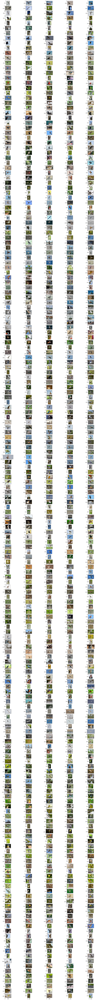

In [ ]:
fig = plt.figure(figsize=(20,200)) # specifying the overall grid size
row = 200
col = 5
k = 0
idx = 1

for i in range(0,200):
    k += 1
    img = df[df['label']==k].sample(n=5, random_state=1)['name']

    for j in img:
      fig.add_subplot(row, col, idx)
      plt.imshow(plt.imread(PATH/'images'/j))
      idx += 1

In [ ]:
df

,id,label,is_train,name
0,1,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
2,3,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
3,4,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
4,5,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
...,...,...,...,...
11783,11784,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...
11784,11785,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11785,11786,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11786,11787,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...


In [ ]:
src_dir = PATH/'images'

# path to destination directory
dest_dir = PATH/'new_sized_images'

# getting all the files in the source directory
files = os.listdir(src_dir)
shutil.copytree(src_dir, dest_dir)

PosixPath('/content/drive/MyDrive/Machine_Learning_Datas/Birds dataset/CUB_200_2011/new_sized_images')

In [ ]:
pip install --upgrade imageio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.4/313.4 kB 2.7 MB/s eta 0:00:00
  Attempting uninstall: imageio
    Found existing installation: imageio 2.31.6
    Uninstalling imageio-2.31.6:
      Successfully uninstalled imageio-2.31.6


In [ ]:
pip install Pillow

In [ ]:
imgs = df['name']
from PIL import Image

for i in range(len(imgs)):
  read_image = io.imread(PATH/'new_sized_images'/imgs.iloc[i])
  img = color.rgb2gray(read_image)
  io.imsave(PATH/'new_sized_images'/df['name'][i],img)

OSError: cannot write mode F as JPEG

In [ ]:
import pandas as pd
from skimage import io
from skimage import color
from PIL import Image


In [ ]:
imgs = df['name']
from PIL import Image

for i in range(len(imgs)):
  read_image = io.imread(PATH/'new_sized_images'/imgs.iloc[i])
  img = color.rgb2gray(read_image)
  img = Image.fromarray(img)  # Convert to PIL Image for saving
  img.save(PATH/'new_sized_images'/df['name'][i], format='PNG')

AttributeError: 'NoneType' object has no attribute 'ReadAsArray'

In [ ]:
pip install scikit-image

In [ ]:
from skimage import io, color
import numpy as np

imgs = df['name']

for i in range(len(imgs)):
    try:
        read_image = io.imread(PATH/'new_sized_images'/imgs.iloc[i])

        # Convert the image to grayscale ('L') using rgb2gray
        img_gray = color.rgb2gray(read_image)

        # Save the grayscale image
        io.imsave(PATH/'new_sized_images'/df['name'][i], img_gray)
    except Exception as e:
        print(f"Error processing image {imgs.iloc[i]}: {e}")


In [ ]:
basewidth = 32
basehight = 32

In [ ]:
imgs = df['name']

for i in range(len(imgs)):
  img = Image.open(PATH/'new_sized_images'/df['name'].iloc[i])
  img = img.resize((basewidth,basehight))
  img.save(PATH/'new_sized_images'/df['name'].iloc[i])

In [ ]:
y = df['label']
X = df.loc[:, df.columns != 'label']

In [ ]:
X_train_df, X_test_df, y_train, y_test = train_test_split(X, y,
                                                    stratify=y,
                                                    test_size=0.25)

In [ ]:
X_train_df.shape, X_test_df.shape

In [ ]:
X_train = []

imgs = X_train_df['name']

for j in imgs:
  img = plt.imread(PATH/'new_sized_images'/j)
  X_train.append(img)

In [ ]:
X_test = []

imgs = X_test_df['name']
for j in imgs:
  img = plt.imread(PATH/'new_sized_images'/j)
  X_test.append(img)

In [ ]:
X_test2 = []

imgs2 = X_test_df['name']

for j in imgs2:
  img = plt.imread(PATH/'images'/j)
  X_test2.append(img)

In [ ]:
len(X_test)

In [ ]:
len(X_train)

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)

In [ ]:
X_train.shape

In [ ]:
X_test.shape

In [ ]:
# get input dimension 28x28 pixels
input_dim = (32,32)
# get output dimensions 10 classes
output_dim = len(np.unique(y_train))+1

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(200, activation='softmax')  # Assuming 200 classes for CUB-200-2011
])


In [ ]:
# compile the model
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [ ]:
# train the model
model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=50,
    validation_data=(X_test, y_test)
)

In [ ]:
model.summary()

In [ ]:
train_loss = model.history.history['loss']

In [ ]:
test_loss = model.history.history['val_acc']

In [ ]:
plt.plot(train_loss)
plt.plot(test_loss,'r')
plt.legend(['Train loss', 'Test loss'])
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.grid()

In [ ]:
train_acc = model.history.history['acc']
test_acc = model.history.history['val_acc']

In [ ]:
plt.plot(train_acc)
plt.plot(test_acc,'r')
plt.legend(['Train acc', 'Test acc'])
plt.xlabel("Number of epochsx10")
plt.ylabel("Loss")
plt.grid()